### SQL is case sensitive
Ex: Query the list of CITY names from STATION that do start with vowels.

SELECT distinct CITY FROM STATION WHERE left(city,1) in ('A', 'E', 'I', 'O', 'U');

Query the list of CITY names from STATION that do end with vowels.

SELECT distinct CITY FROM STATION WHERE right(city,1) in ('a','i','u','e','o');

### UPDATE
Be careful when updating records. If you omit the WHERE clause, ALL records will be updated!

### LIKE
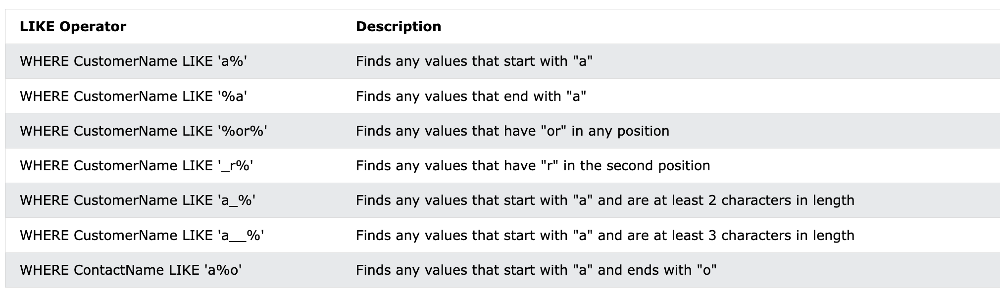


### Wildcards!
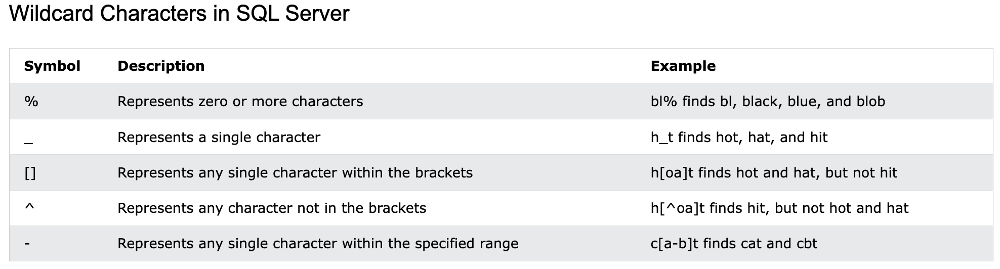

# SUBSTRING()
Substring(col_name, starting_index, 3) --> 3 indexes after starting index

# Join
By default it's inner join
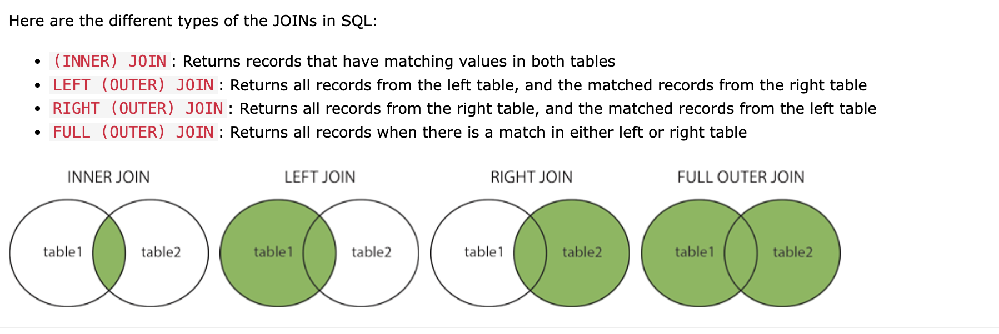

### SQL Self Join
A self join is a regular join, but the table is joined with itself. The following SQL statement matches customers that are from the same city: <br/>

SELECT A.CustomerName AS CustomerName1, B.CustomerName AS CustomerName2, A.City <br/>
FROM Customers A, Customers B  <br/>
WHERE A.CustomerID <> B.CustomerID  <br/>
AND A.City = B.City  <br/>
ORDER BY A.City;


# UNION & UNION ALL
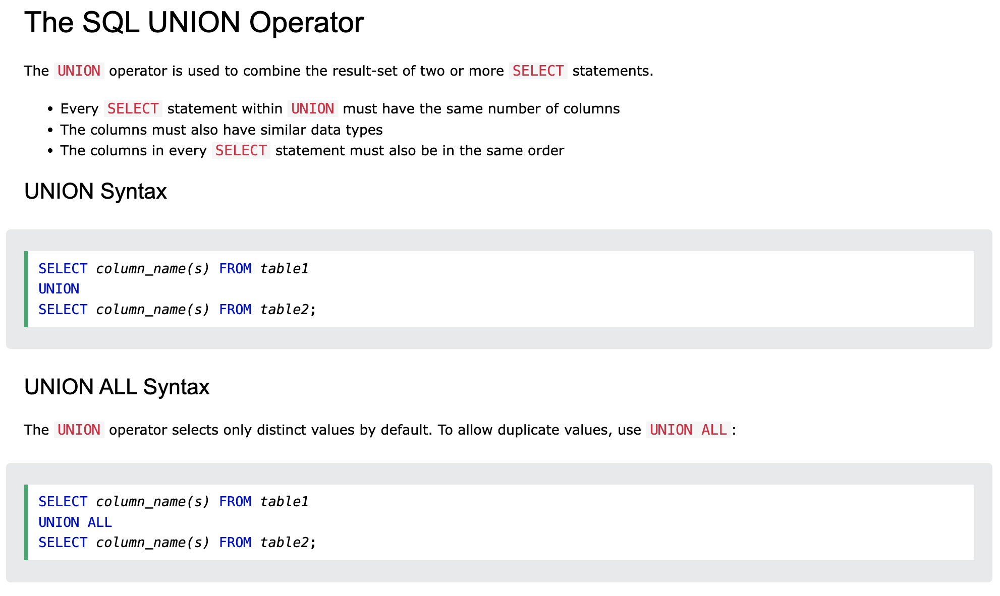

## UNION...WHERE
Returns the German cities (only distinct values: UNION / duplicate values: UNION ALL) from both the "Customers" and the "Suppliers" table:
SELECT City, Country FROM Customers <br/>
WHERE Country='Germany' <br/>
**UNION / UNION ALL** <br/>
SELECT City, Country FROM Suppliers <br/>
WHERE Country='Germany' <br/>
ORDER BY City; <br/>

# ROUND vs CEIL vs FLOOR
CEIL(99672.8591) = 99673 rounded **UP** to the nearest integer. <br/>
FLOOR(99672.8591) = 99672  rounded **down** to the nearest integer. <br/>
ROUND(99672.8591) = 99673 

# Trim() 
**TRIM()** removes blank spaces from left and right 
**Ltrim()** removes blank spaces from left  <br/>
**Rtrim()** removes blank spaces from right  <br/>


## CAST() Function
Convert a value to an int datatype: <br/>
SELECT CAST(25.65 AS int); --> output 25 

Convert a value to a varchar/datetime datatype: <br/>
SELECT CAST(25.65 AS varchar); <br/>
SELECT CAST('2017-08-25' AS datetime);

# SUBQUERRIES 
## EXISTS
The EXISTS operator is used to test for the existence of any record in a subquery.
SELECT column_name(s) <br/>
FROM table_name  <br/>
WHERE EXISTS  <br/>
(SELECT column_name FROM table_name WHERE condition);

## ANY and ALL
ANY and ALL operators allow you to perform a comparison between a single column value and a range of other values. <br/>
ANY: returns TRUE if ANY of the subquery values meet the condition <br/>
ALL: returns TRUE if ALL of the subquery values meet the condition - used with SELECT, WHERE and HAVING statements <br/>

EXEMPLE: ists the ProductName, FROM Products TABLE, if it finds ANY records in the OrderDetails table has Quantity equal to 10 <br/>
SELECT ProductName <br/>
FROM Products <br/>
WHERE ProductID = ANY <br/>
  (SELECT ProductID <br/>
  FROM OrderDetails <br/>
  WHERE Quantity = 10);
  
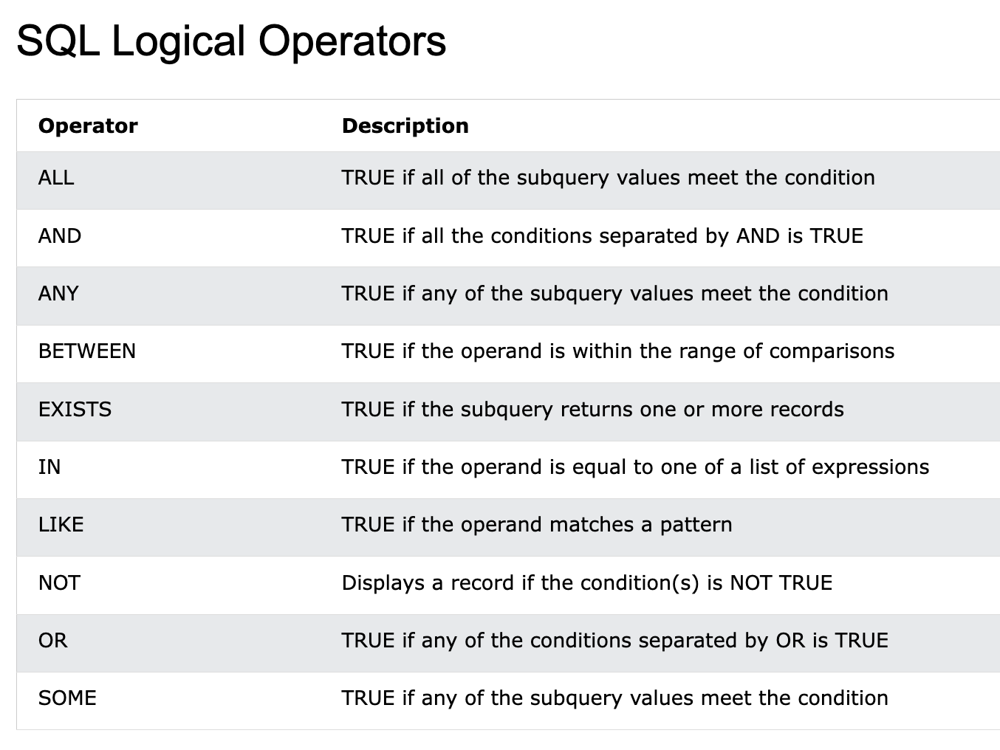


# CASE Expression
CASE expression goes through conditions and returns a value when the first condition is met (like an if-then-else statement). So, once a condition is true, it will stop reading and return the result. If no conditions are true, it returns the value in the ELSE clause.

CASE
    WHEN condition1 THEN result1 <br/>
    WHEN condition2 THEN result2 <br/>
    WHEN conditionN THEN resultN <br/>
    ELSE result <br/>
END;

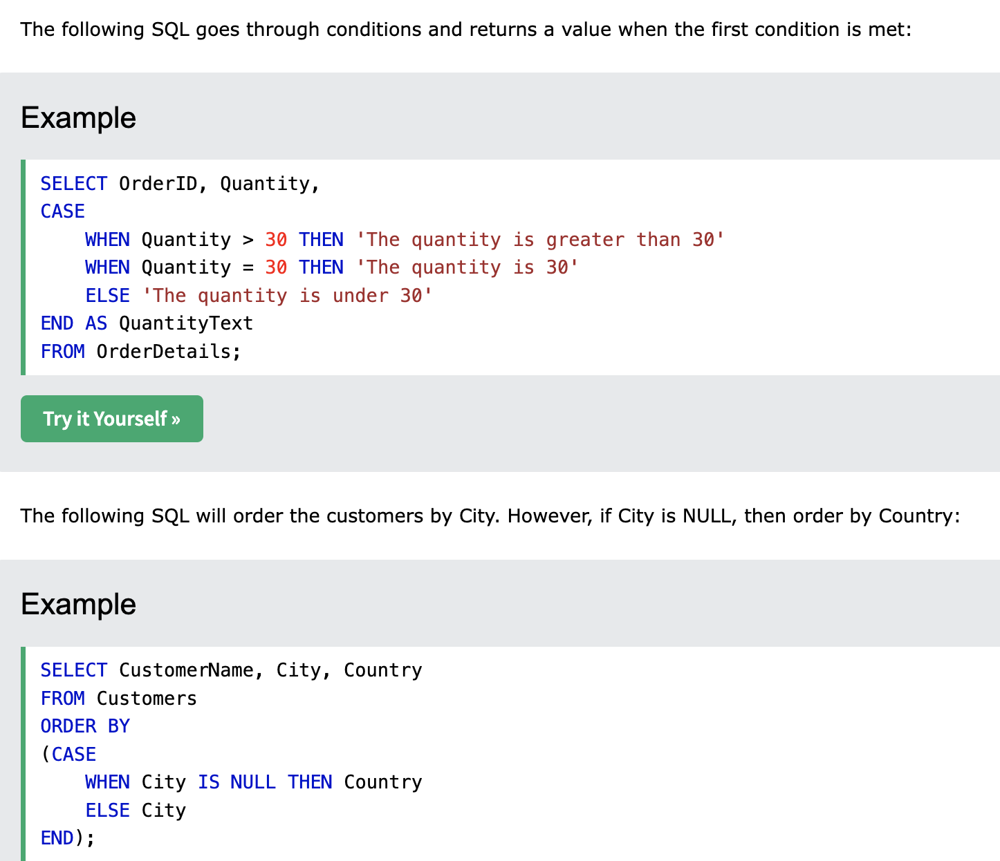

## IFNULL()
IF any of the "UnitsOnOrder" values are NULL, the result will be NULL. <br/>
SELECT ProductName, UnitPrice * (UnitsInStock + UnitsOnOrder) <br/>
FROM Products; <br/>

**IFNULL()** or **COALESCE()** function lets you return an alternative value if an expression is NULL: <br/>
SELECT ProductName, UnitPrice * (UnitsInStock + IFNULL(UnitsOnOrder, 0)) <br/>
FROM Products; 

## Stored Procedure
If you have an SQL query that you write over and over again, save it as a stored procedure, and then just call it to execute it. <br/>

CREATE PROCEDURE procedure_name <br/>
AS  <br/>
sql_statement (ex: SELECT * FROM Customers) <br/>
GO; <br/>

EXEC procedure_name; 

## Single Line comments 
-- 

## Multi-line Comments
/* .... <br/>
... <br/>
*/  

Could be used to ignore a part of the statement <br/>
SELECT CustomerName, /*City,*/ Country FROM Customers;

# CTE : Common Table Expression 

CTE Is a temporary table that you return within your query --> helpful for splitting your queries into readable chunks. <br/>
NOTE: CTEs only exist inside the query where you create them, and you can't reference them in later queries.  <br/>
(1) first, we create the CTE, and then (2) we write a query that uses the CTE.

WITH Seniors AS   <br/>
( SELECT ID, Name  <br/>
FROM records.pets  <br/>
WHERE Years_old> 5  <br/>
)  <br/>
SELECT ID  <br/>
FROM Seniors <br/>




# Partition By 
**Groupy By**: reduces the number of row by calculation the average or sum of each group. In the below exemple, group by will return 2 rows (one for each gender) <br/>
**PARTITION BY**: divides the result set into partition and changes how the window function is calculated (doesn't reduce the number of rows in the ouptput)

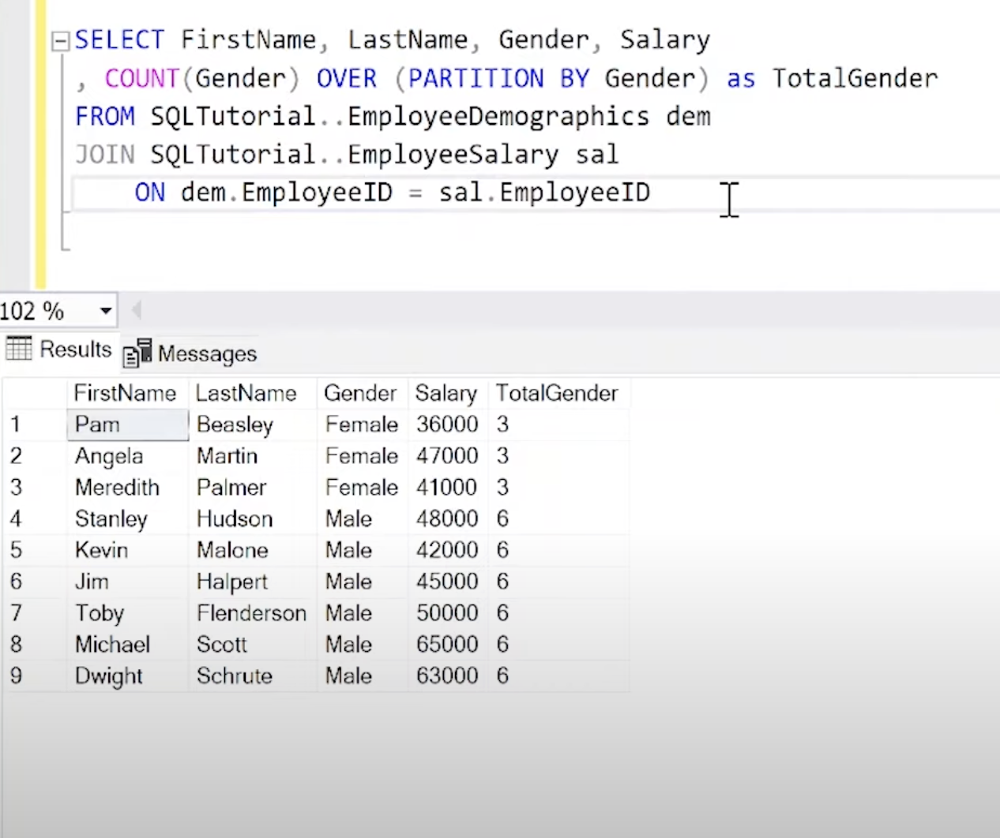



# ROW_NUMBER()
ROW_NUMBER() OVER (<partition_definition> <order_definition>)

## 1) Assigning sequential numbers to rows

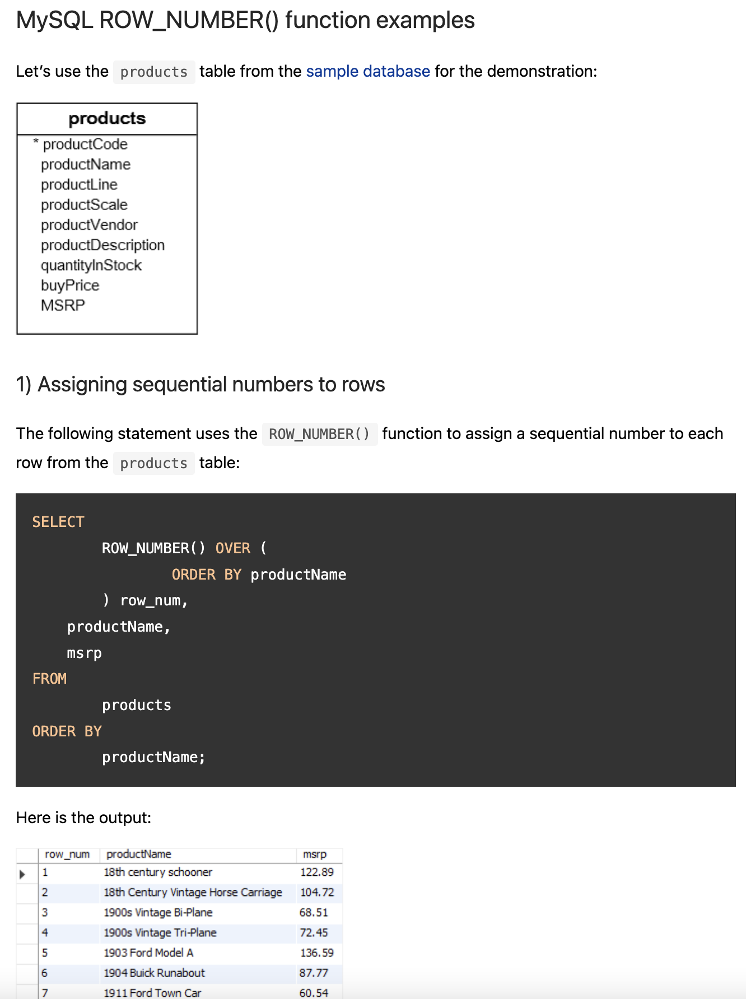

## 2) Finding top N rows of every group
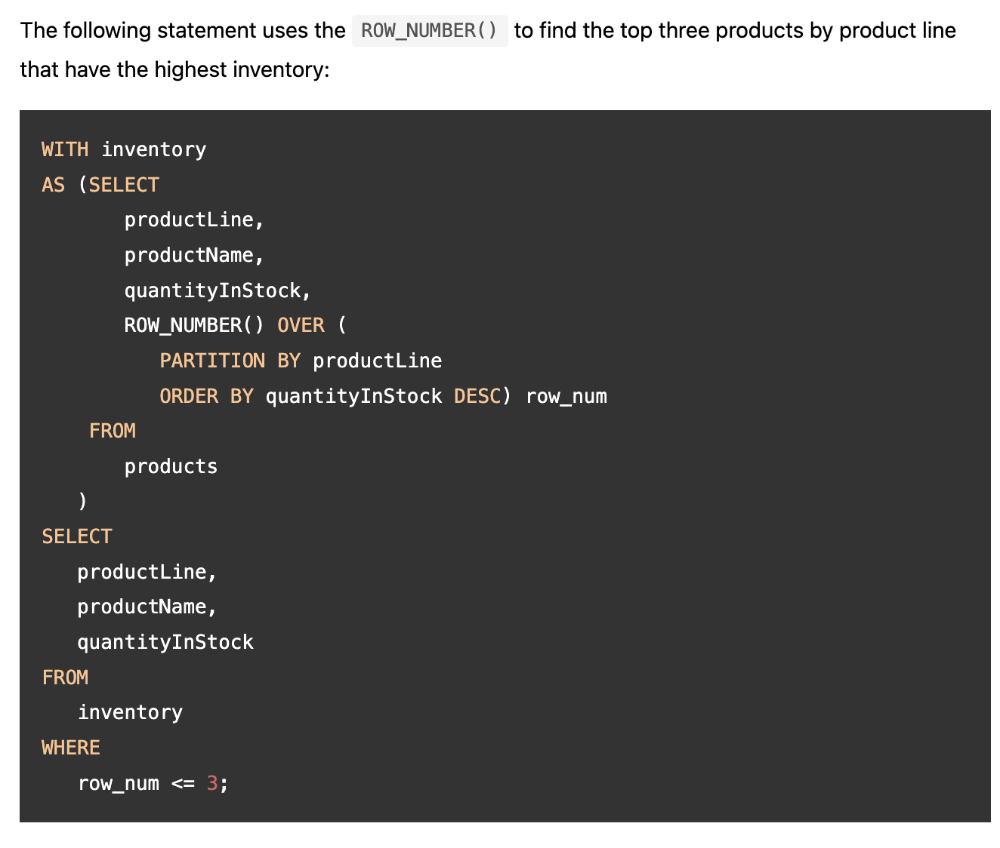

## ROW_NUMBER & PARTION 
SELECT <br/>
ROW_NUMBER() OVER (ORDER BY code) as row_num, <br/>
id, <br/>
code, <br/>
coins_needed, <br/>
power  <br/>
FROM Wands  <br/>
;


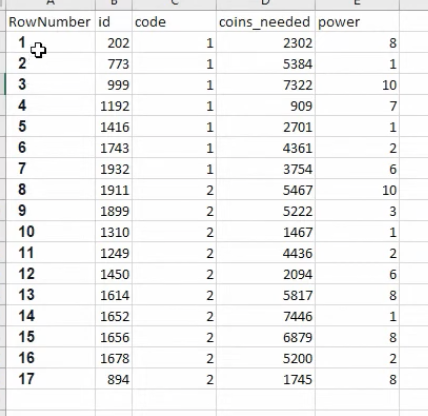

SELECT <br/>
ROW_NUMBER() OVER (PARTITION BY code ORDER BY code) as row_num, <br/>
id, <br/>
code, <br/>
coins_needed, <br/>
power  <br/>
FROM Wands  <br/>
;

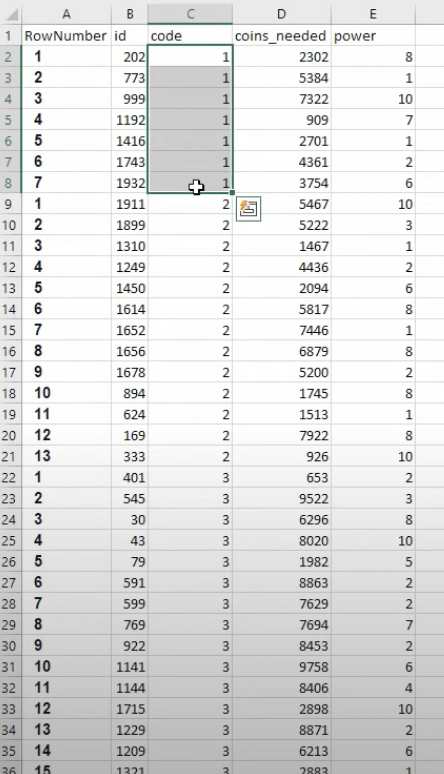

When we add partition by we are restarting the counting by code

# rank()
Find the top 3 employees n each department earning the max salary 


SELECT * FROM (SELECT *   <br/>
rank() over(partition by dept_name order by salary DESC )  AS rnk  <br/>
FROM employee) as x <br/>
where x.rnk < 3  <br/>


**N.B.:** Rank nb will be the same for people earning same salary but for every duplicate records it skips a nb 
Ex: 
Top salary --> rank <br/>
5000 --> rank 1 <br/>
4000 --> rank 2 <br/>
4000 --> rank 2 <br/>
3000 --> **rank 4 (not 3)**



# dense_rank()
SELECT * FROM (SELECT *   <br/>
dense_rank() over(partition by dept_name order by salary DESC )  AS d_rnk  <br/>
FROM employee) as x <br/>
where x.rnk < 3  <br/>

Rank nb will be the same for people earning same salary but for every duplicate records it doesn’t skip a nb
Ex: 
Top salary --> rank <br/>
5000 --> rank 1 <br/>
4000 --> rank 2 <br/>
4000 --> rank 2 <br/>
3000 --> **rank 3**

# Difference between row_number(), rank() and dense_rank()
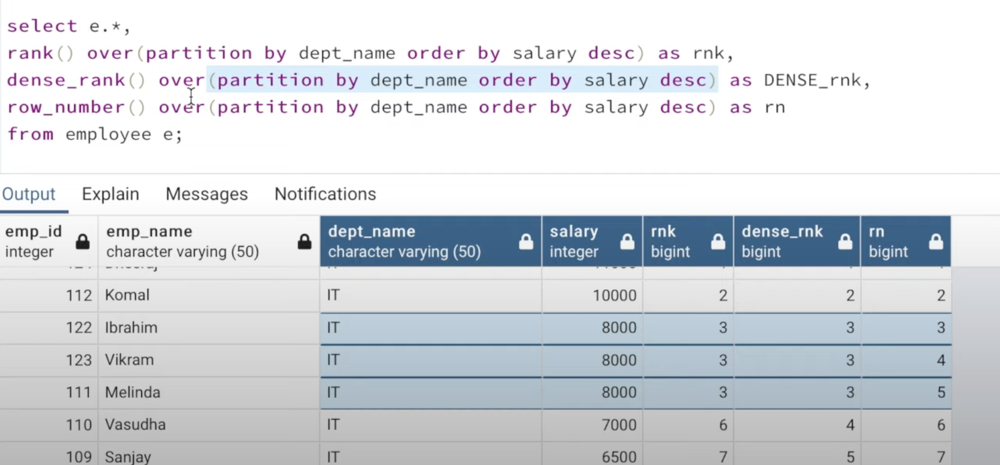

# lag() and lead()

**lag(salary)** Add prev_emp_col showing the salary of each previous employee. <br/>
First value in each department would be null (because no previous value)

**lag(salary, 2, 0)** --> will return the value of 2 previous rows and 0 when the value is null (0 is the default)


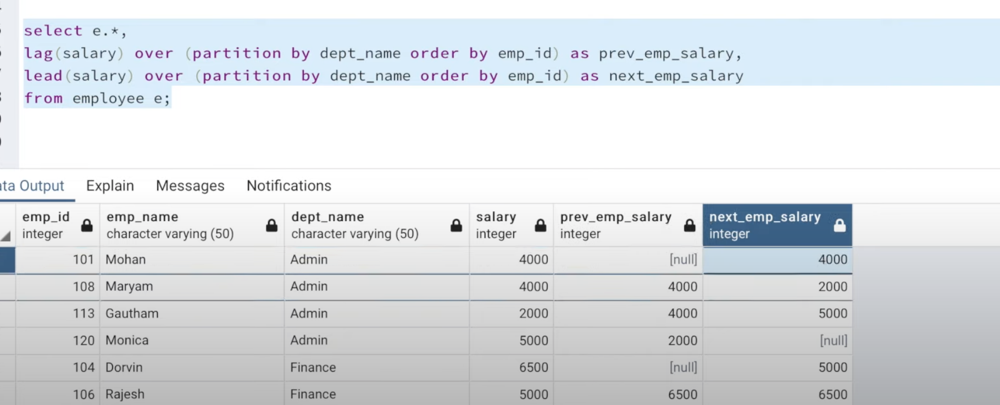

### Display if the salary of an employee is higher, lower or equal to previous employee' salary 
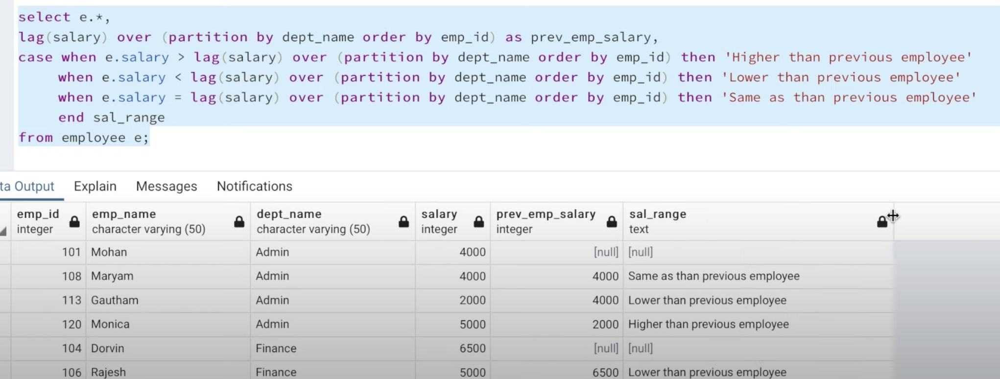

# NOTES
## Not equal 
WHERE age <> 20 

## ALIAS 
SELECT CustomerName AS Customer, ContactName AS [Contact Person] <br/>
FROM Customers; <br/>
It requires **double quotation marks or square brackets** if the alias name contains spaces:

## CONCAT 
To concat multiple values <br/>
SELECT CustomerName, CONCAT(Address,', ',PostalCode,', ',City,', ',Country) AS Address <br/>
FROM Customers;

## HAVING vs WHERE 
The HAVING clause was added to SQL because the WHERE keyword cannot be used with aggregate functions.

SELECT column_name(s)  <br/>
FROM table_name  <br/>
WHERE condition  <br/>
GROUP BY column_name(s)  <br/>
HAVING condition  <br/>
ORDER BY column_name(s);



# Date and Time Functions 

## DATEPART() function 
SELECT DATEPART(year, '2017/08/25') AS DatePartInt; output will be 2017 <br/>
SELECT DATEPART(month, '2017/08/25') AS DatePartInt; output will be 8
 

## date_trunc() function 
Allows you to round a date or timestamp to a specified unit of time, such as a day, week, month, or year

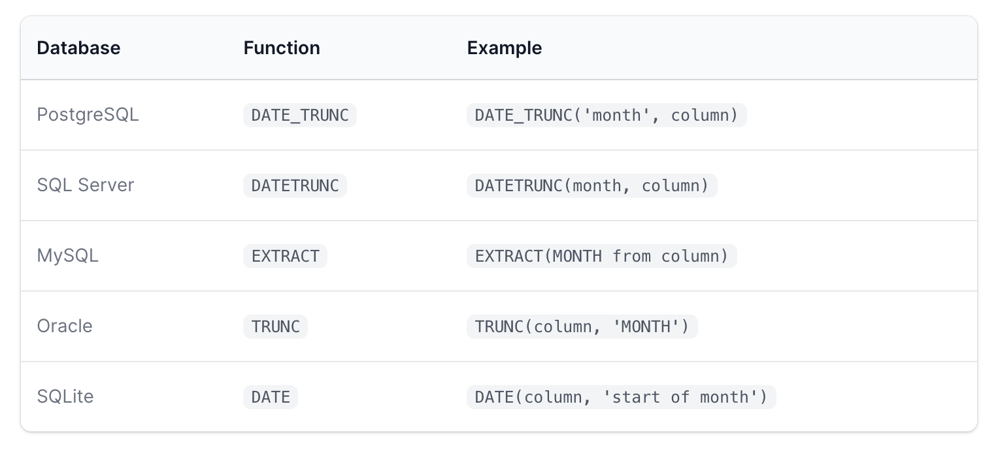

## DATEDIFF function
Calculates the difference between two dates or timestamps, typically returning the number of days between the two dates. Here's the basic syntax:
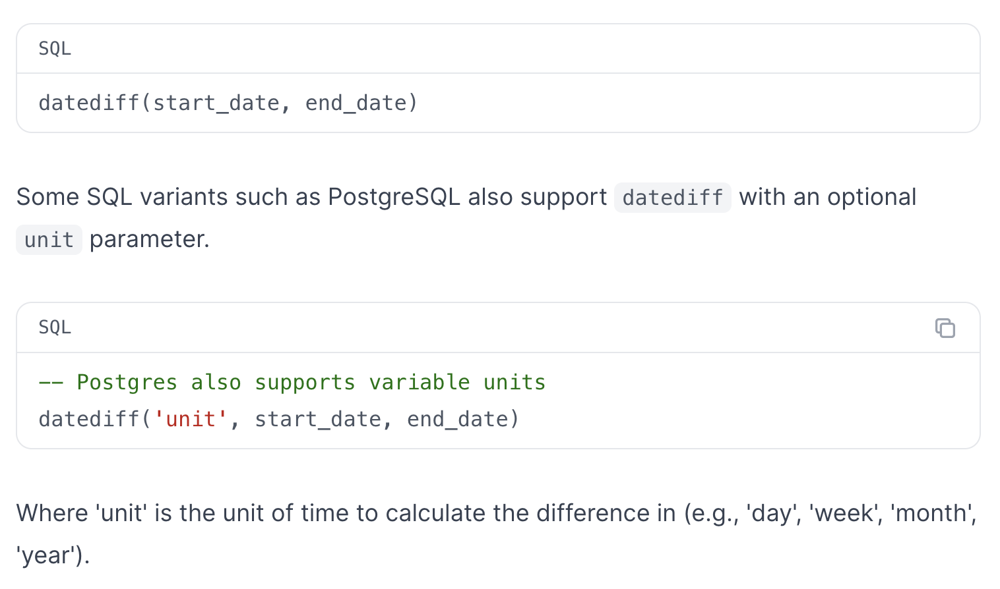

# Pivot / Case 
In MySQL Pivot method is not supported --> we use Case
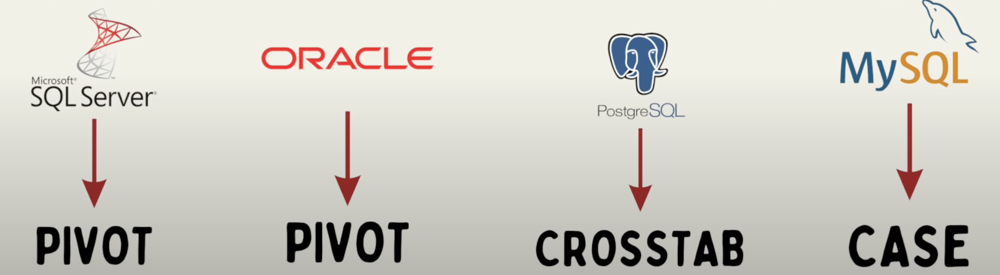

Exercice: Transform first table to the second
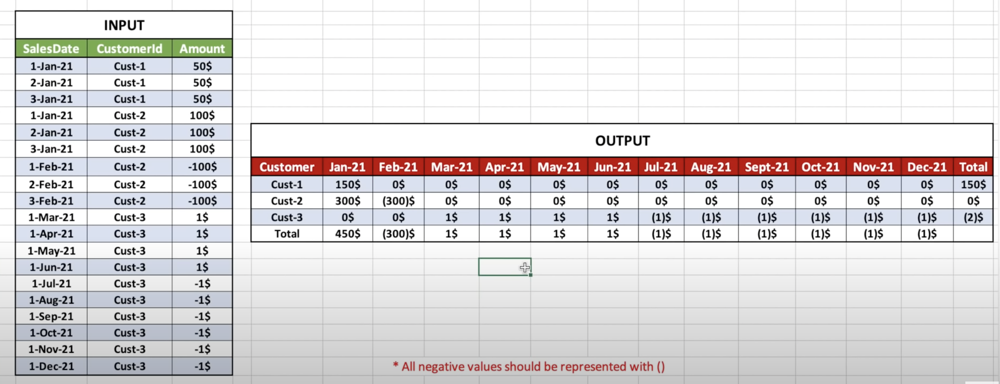

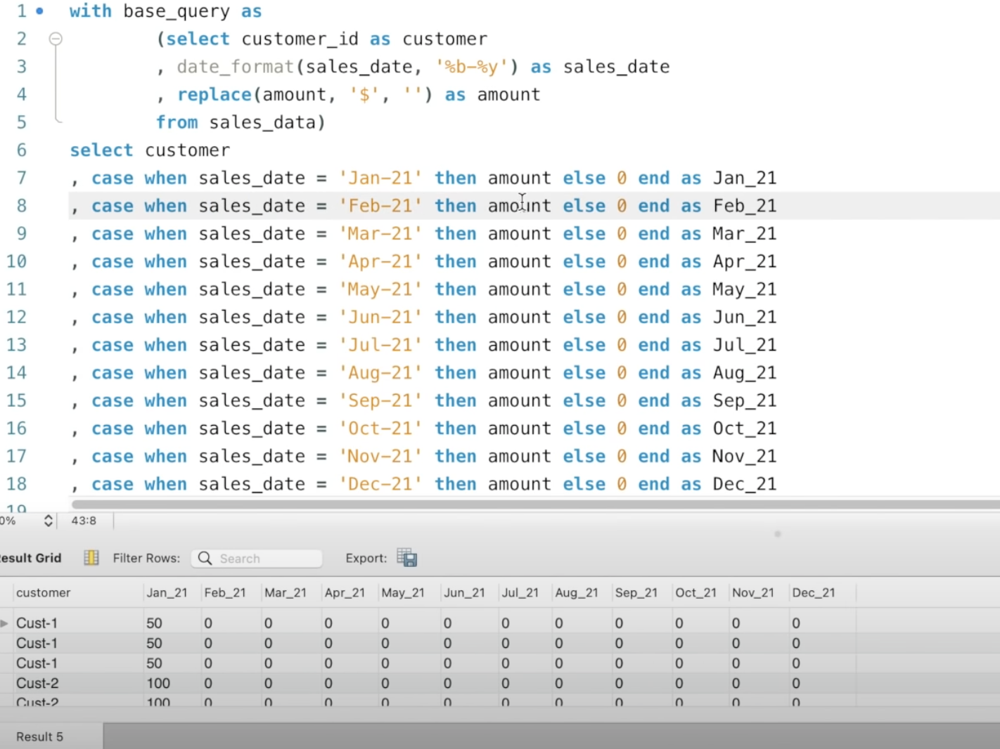


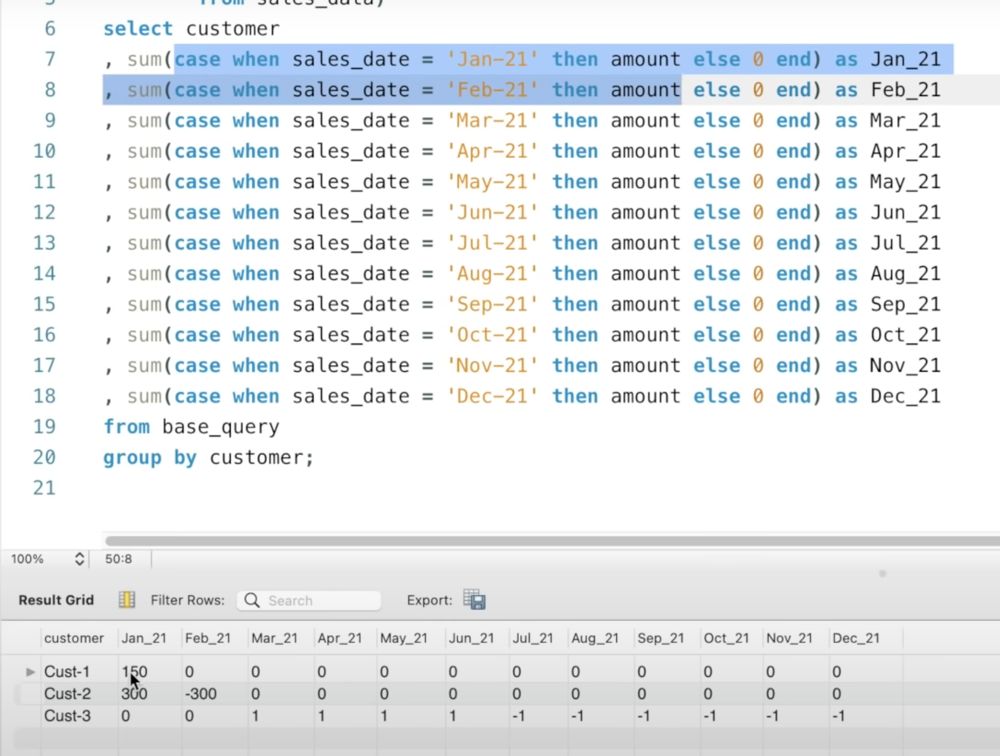

To get rge total row
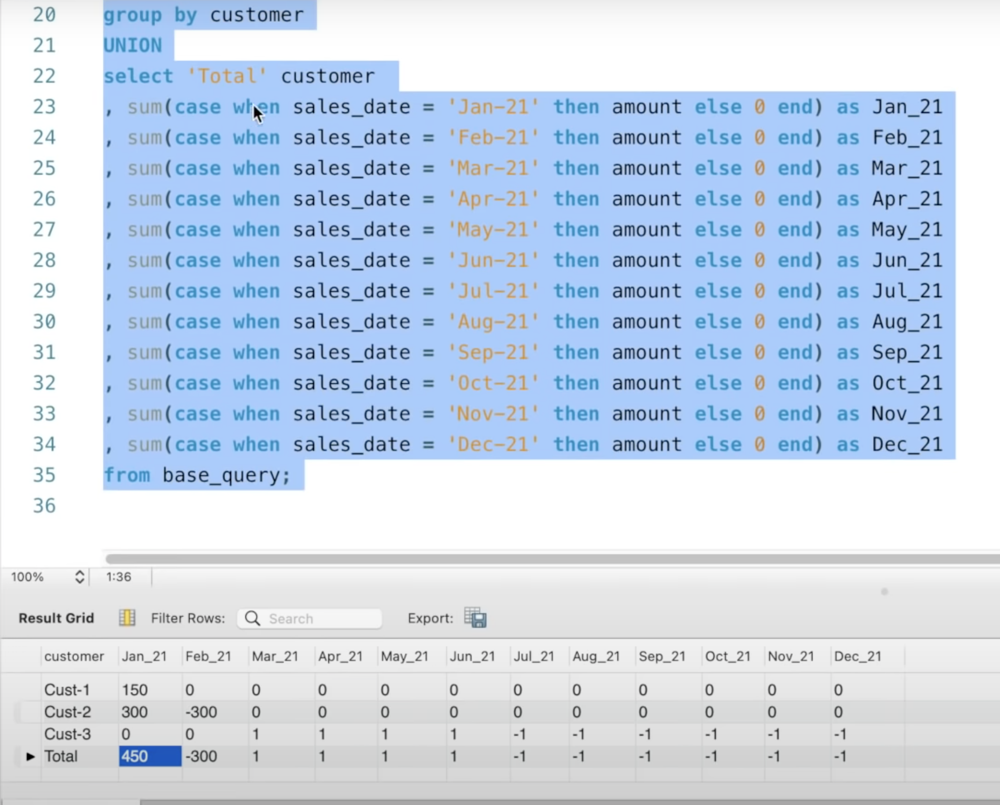

To add the last total row 
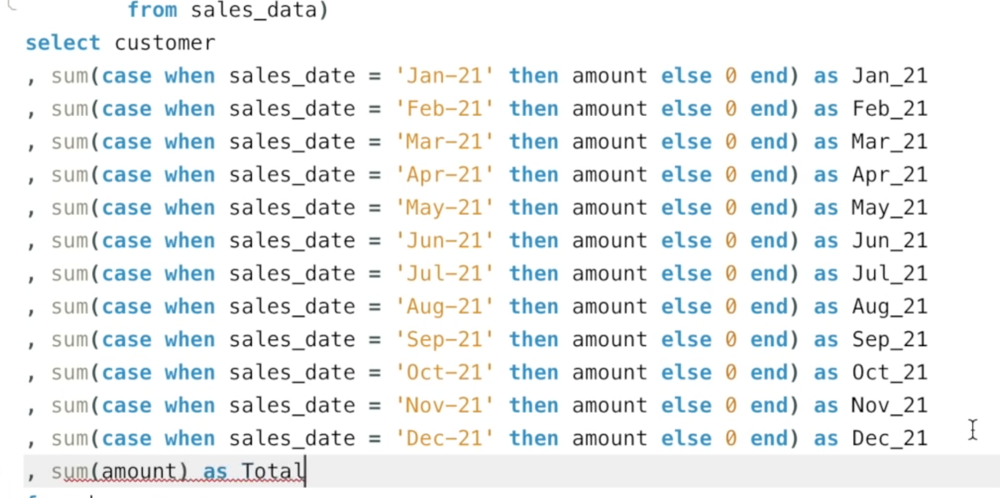

And in the union we add (As last value is empty)  <br/>
,'' as Total 

https://www.youtube.com/watch?v=4p-G7fGhqRk

### We can add max or min to each case to remove Null values
max or min function doesn't influence result cuz they all calculate after omit null value

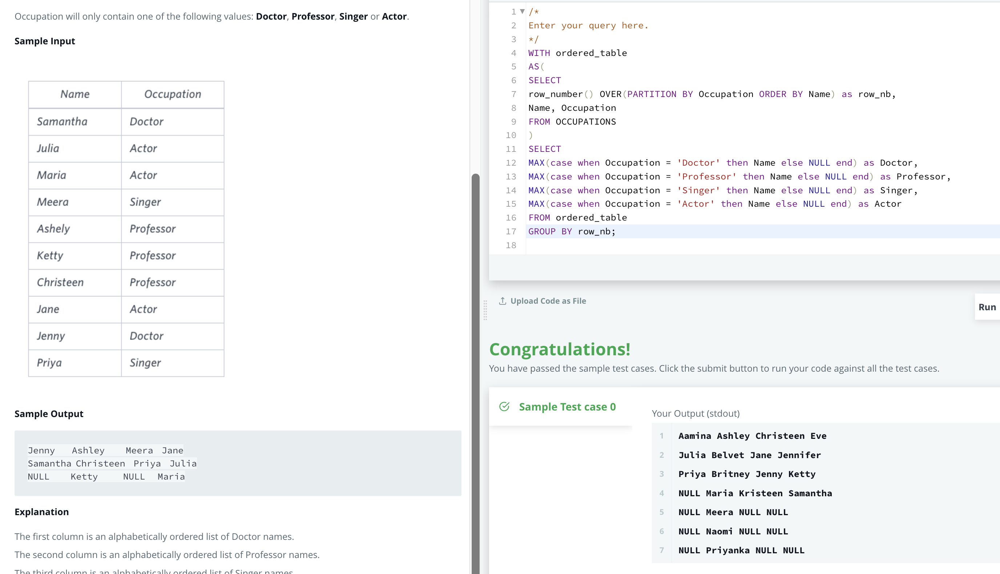

### Print prime numbers less than 1000
Create a table with all numbers 2-1000, then select all numbers from it filtering those where we found a divisor of it.
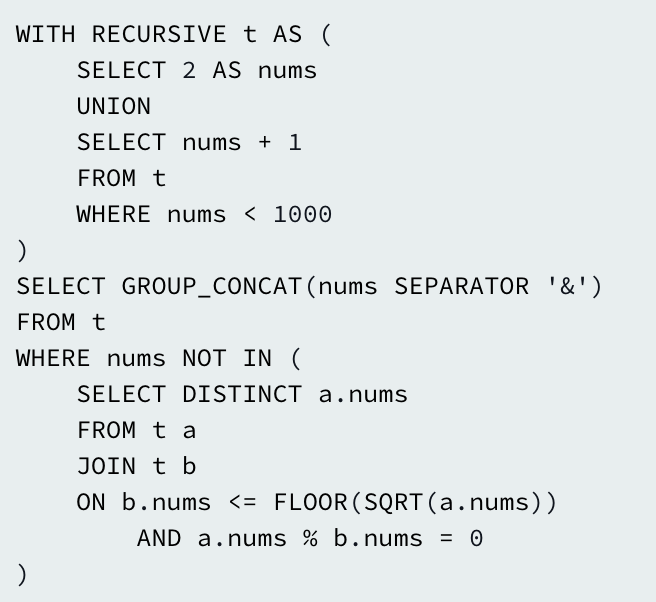

# Find the average of the last 3 rows 
Calculate the rolling average tweet count for each user over a 3-day period

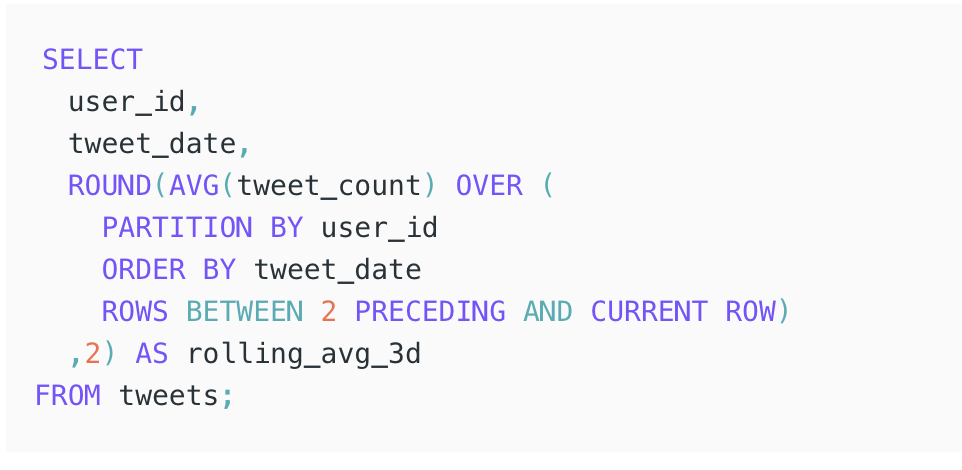

# LIMIT and OFFSET 
Find the N-th result using LIMIT and OFFSET

Which is the 3rd least popular course?


SELECT * FROM courses </br>
ORDER BY student_count ASC </br>
LIMIT 1 OFFSET 2; </br>